# This .ipynb contains the code for Experiment 2, 3 and 4 for BERT model.

Note: In order to see the descriptions about these experiments, please refer to the readme.md file.



# Experiment 2


In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
!pip install captum

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 18.1 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset
ds = load_dataset("rajpurkar/squad")

README.md:   0%|          | 0.00/7.62k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/14.5M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/1.82M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/87599 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10570 [00:00<?, ? examples/s]

In [ ]:
sample = ds["validation"][0]
print("Title:", sample["title"])
print("Context:", sample["context"])
print("Question:", sample["question"])
print("Answers:", sample["answers"])


Title: Super_Bowl_50
Context: Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi's Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game would have been known as "Super Bowl L"), so that the logo could prominently feature the Arabic numerals 50.
Question: Which NFL team represented the AFC at Super Bowl 50?
Answers: {'text': ['Denver Broncos', 'Denver Broncos', 'Denver Broncos'], 'answer_start': [177, 177, 177]}


In [ ]:
from transformers import AutoModel, AutoTokenizer
model_used = "bert-base-uncased"

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
model = AutoModel.from_pretrained(model_used, output_attentions=True)
tokenizer = AutoTokenizer.from_pretrained(model_used)


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
from transformers import AutoTokenizer, AutoModelForQuestionAnswering
from captum.attr import IntegratedGradients
import torch

In [ ]:
model_id = "bert-large-uncased-whole-word-masking-finetuned-squad"  # Pre-trained BERT for QA
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForQuestionAnswering.from_pretrained(model_id)
model.eval()

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-large-uncased-whole-word-masking-finetuned-squad were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertForQuestionAnswering(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 1024, padding_idx=0)
      (position_embeddings): Embedding(512, 1024)
      (token_type_embeddings): Embedding(2, 1024)
      (LayerNorm): LayerNorm((1024,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-23): 24 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=True)
              (key): Linear(in_features=1024, out_features=1024, bias=True)
              (value): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
              (LayerNorm): LayerNorm((1024,)

In [ ]:
context = sample["context"]
question = sample["question"]

In [ ]:
question

'Which NFL team represented the AFC at Super Bowl 50?'

In [ ]:
inputs = tokenizer(question, context, return_tensors="pt")

In [ ]:
input_ids = inputs["input_ids"]
attention_mask = inputs["attention_mask"]

In [ ]:
embeddings = model.get_input_embeddings()(input_ids)
embeddings.requires_grad_()


tensor([[[ 0.0178,  0.0214,  0.0124,  ..., -0.0172,  0.0025, -0.0284],
         [-0.0205,  0.0311,  0.0483,  ..., -0.0027,  0.0884,  0.0098],
         [-0.0098,  0.0807, -0.0053,  ...,  0.0148, -0.0110,  0.0584],
         ...,
         [-0.0096,  0.0484,  0.0333,  ..., -0.0610, -0.0253, -0.0424],
         [-0.0014,  0.0351,  0.0119,  ...,  0.0060,  0.0283, -0.0075],
         [ 0.0140,  0.0165, -0.0365,  ..., -0.0109, -0.0279,  0.0108]]],
       grad_fn=<EmbeddingBackward0>)

In [ ]:
def forward_with_embeddings(embeddings, attention_mask):
    outputs = model(
        inputs_embeds=embeddings,
        attention_mask=attention_mask
    )
    return outputs.start_logits

**This is our first interpretability method- Integrated Gradients**

In [ ]:
ig = IntegratedGradients(forward_with_embeddings)

In [ ]:
attributions, delta = ig.attribute(
    inputs=embeddings,
    additional_forward_args=(attention_mask,),
    target=0,
    return_convergence_delta=True
)

In [ ]:
tokens = tokenizer.convert_ids_to_tokens(input_ids[0])
attribution_scores = attributions.sum(dim=2).squeeze(0).detach().numpy()

# Results with Captum

In [ ]:
for token, score in zip(tokens, attribution_scores):
    print(f"{token}: {score}")

[CLS]: -0.1401354146927184
which: 0.1671072540250025
nfl: -0.01657968629149975
team: -0.14766656478200801
represented: -0.07403745415381857
the: -0.049148769859592024
afc: -0.3165264149894356
at: 0.14671615803526905
super: -0.2583247926086579
bowl: -0.17788153178534932
50: -0.14436005672643692
?: -0.07156529549145056
[SEP]: -0.32001391556721537
super: -0.23260081907372615
bowl: -0.2720368371669354
50: 0.10264243900955346
was: -0.12015599977791054
an: -0.0007412504204825643
american: -0.05443365995089507
football: -0.09107848899904489
game: -0.11489025545468913
to: -0.04792419210700193
determine: -0.0893452035308375
the: 0.03472320253472283
champion: -0.07169963823048346
of: 0.024372489996223212
the: 0.0425663396304574
national: -0.035010194029572235
football: -0.034497775166332845
league: -0.0749784022969362
(: -0.017571122103165124
nfl: -0.1310772082546274
): 0.02460789866562583
for: -0.0685262658557238
the: 0.03170560626822884
2015: -0.0692367540003701
season: -0.08625182631814013
.:

In [ ]:
!pip install plotly

In [ ]:
import plotly.graph_objects as go

def plot_interactive_attributions(tokens, attributions):

    tokens = [token.replace("##", "") for token in tokens]
    tokens = [token if isinstance(token, str) else str(token) for token in tokens]

    fig = go.Figure(data=[go.Bar(
        x=tokens,
        y=attributions,
        hoverinfo='x+y',  # Show token and attribution score on hover
        marker=dict(color=attributions, colorscale='Viridis', colorbar=dict(title="Attribution")),
    )])

    fig.update_layout(
        title="Token-Level Attribution Scores",
        xaxis_title="Tokens",
        yaxis_title="Attribution Score",
        xaxis=dict(tickangle=90),
        showlegend=False
    )

    fig.show()

# plot the attributions
plot_interactive_attributions(tokens, attribution_scores)


In [ ]:
###########################################################3

In [ ]:
with torch.no_grad():
    outputs = model(**inputs, output_attentions=True)
    attention_weights = outputs.attentions

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [ ]:
layer_idx = 0  # The layer to visualize (0 for the first layer)
head_idx = 0   # The attention head to visualize (0 for the first head)

In [ ]:
# Extracting the attention weights for the specified layer and head
attention = attention_weights[layer_idx][0, head_idx].cpu().numpy()

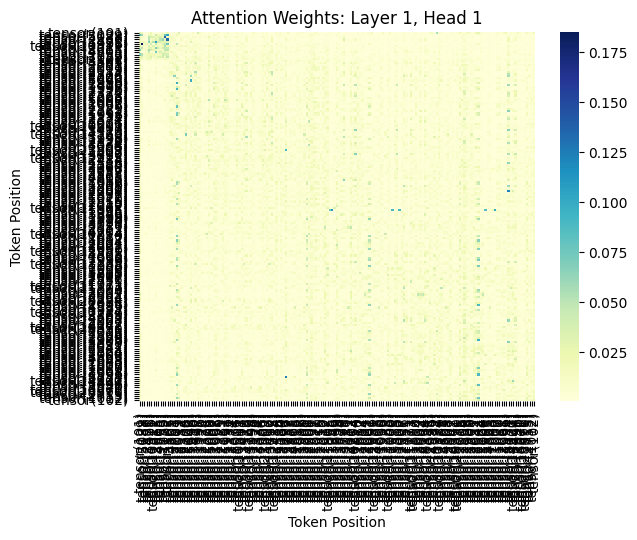

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.heatmap(attention, xticklabels=inputs["input_ids"][0], yticklabels=inputs["input_ids"][0], cmap="YlGnBu")
plt.xlabel("Token Position")
plt.ylabel("Token Position")
plt.title(f"Attention Weights: Layer {layer_idx + 1}, Head {head_idx + 1}")
plt.show()

In [ ]:
layer_idx = 1  # The layer to visualize (1 for the second layer)
head_idx = 1  # The attention head to visualize (0 for the second head)

In [ ]:
attention = attention_weights[layer_idx][0, head_idx].cpu().numpy()

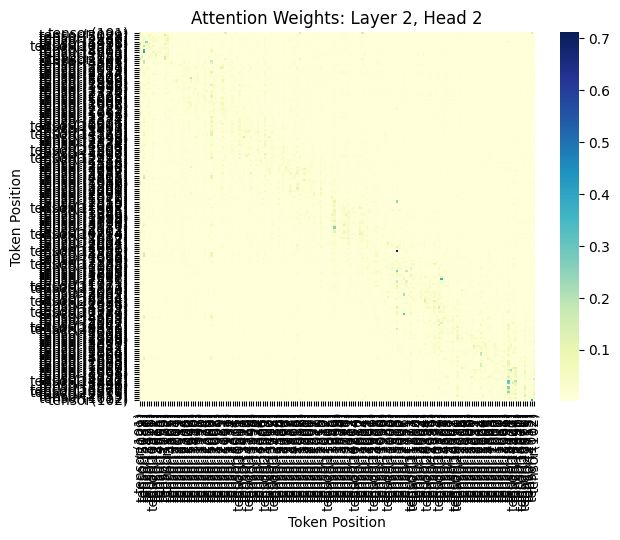

In [ ]:
sns.heatmap(attention, xticklabels=inputs["input_ids"][0], yticklabels=inputs["input_ids"][0], cmap="YlGnBu")
plt.xlabel("Token Position")
plt.ylabel("Token Position")
plt.title(f"Attention Weights: Layer {layer_idx + 1}, Head {head_idx + 1}")
plt.show()

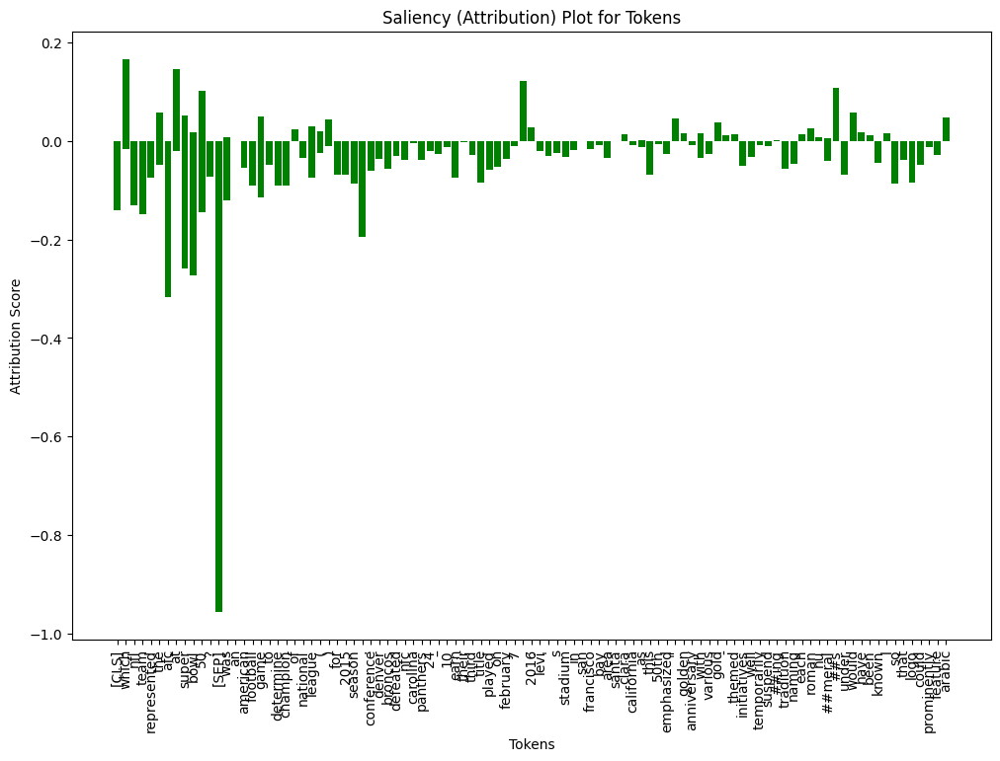

In [ ]:
# Visualize the saliency plot (attribution scores) as a bar chart
plt.figure(figsize=(12, 8))
plt.bar(tokens, attribution_scores, color='green')
plt.xticks(rotation=90)
plt.xlabel('Tokens')
plt.ylabel('Attribution Score')
plt.title('Saliency (Attribution) Plot for Tokens')
plt.show()

## **Attention Rollout Method**



In [ ]:
# Define a function to capture attention weights
def get_attention_weights(model, input_ids):
    attention_weights = []

    # Define a hook to capture attention weights from each layer
    def hook_fn(module, input, output):
        # The output contains both hidden states and attention weightse
        attention_weights.append(output[1])  # The second element contains the attention weights

    # Attach the hook to each layer of the model
    hooks = []
    for layer in model.encoder.layer:
        hook = layer.attention.self.register_forward_hook(hook_fn)
        hooks.append(hook)

    # Forward pass through the model
    with torch.no_grad():
        model(input_ids=input_ids)

    # Remove hooks after use
    for hook in hooks:
        hook.remove()

    return attention_weights

In [ ]:
# Process one example from the dataset
example = ds['validation'][0]

In [ ]:
example

{'id': '56be4db0acb8001400a502ec',
 'title': 'Super_Bowl_50',
 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game would have been known as "Super Bowl L"), so that the logo could prominently feature the Arabic numerals 50.',
 'question': 'Which NFL team represented the AFC at Super Bowl 50?',
 'answers': {'text': ['Denver Broncos', 'Denver Broncos', 'Denver Broncos'],


In [ ]:
inputs = tokenizer(example['question'], example['context'], return_tensors="pt")

In [ ]:
for i, layer_attention in enumerate(attention_weights):
    print(f"Layer {i+1} Attention Weights:")
    print(layer_attention)

Layer 1 Attention Weights:
tensor([[[[2.6243e-02, 2.2385e-02, 1.3542e-03,  ..., 5.0976e-03,
           7.0244e-03, 1.8693e-02],
          [7.9435e-02, 6.2083e-02, 3.4877e-03,  ..., 1.4557e-03,
           2.8602e-03, 2.8294e-03],
          [1.5481e-02, 4.8486e-03, 1.4456e-02,  ..., 1.4417e-03,
           5.5601e-03, 7.1214e-04],
          ...,
          [2.3654e-02, 1.2938e-03, 3.2509e-04,  ..., 2.4118e-02,
           7.7176e-03, 1.6565e-02],
          [6.9202e-03, 3.4715e-03, 1.2831e-04,  ..., 4.9318e-03,
           5.4011e-03, 1.8159e-02],
          [5.3389e-03, 2.3420e-04, 6.3772e-05,  ..., 8.9790e-03,
           1.5659e-02, 1.9654e-02]],

         [[2.0161e-02, 3.5625e-03, 1.0406e-03,  ..., 4.3535e-03,
           3.7185e-05, 5.3477e-04],
          [2.2961e-02, 1.6880e-02, 1.2331e-02,  ..., 2.4067e-03,
           2.0990e-04, 1.0751e-02],
          [3.3291e-02, 1.4548e-02, 3.5433e-02,  ..., 8.4951e-04,
           9.2825e-04, 3.3932e-03],
          ...,
          [5.2768e-03, 1.5814e-0

In [ ]:
start_position = example['answers']['answer_start'][0]
end_position = start_position + len(example['answers']['text'][0])

print(f"Answer start position: {start_position}, end position: {end_position}")

Answer start position: 177, end position: 191


In [ ]:
# Average attention scores across all layers and heads
def average_attention_scores(attention_weights):
    # attention_weights is a list of tensors, one for each layer
    # Each tensor is of shape (num_heads, seq_len, seq_len)
    # We'll average across heads and layers

    avg_attention_scores = []

    for layer_attention in attention_weights:
        # layer_attention is of shape (num_heads, seq_len, seq_len)
        avg_layer_attention = layer_attention.mean(dim=0).mean(dim=0)  # Average across heads and seq_len
        avg_attention_scores.append(avg_layer_attention)  # Resulting shape is (seq_len,)

    # Stack to get shape (num_layers, seq_len)
    avg_attention_scores = torch.stack(avg_attention_scores)  # Shape: (num_layers, seq_len)
    final_attention_scores = avg_attention_scores.mean(dim=0)  # Average across layers (Shape: seq_len,)

    return final_attention_scores


In [ ]:
final_attention_scores = average_attention_scores(attention_weights)
tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])
attn_data = [(token, final_attention_scores[i, i].item()) for i, token in enumerate(tokens) if i < final_attention_scores.shape[0]]
attn_data_sorted = sorted(attn_data, key=lambda x: x[1], reverse=True)
sorted_tokens, sorted_attention_scores = zip(*attn_data_sorted)


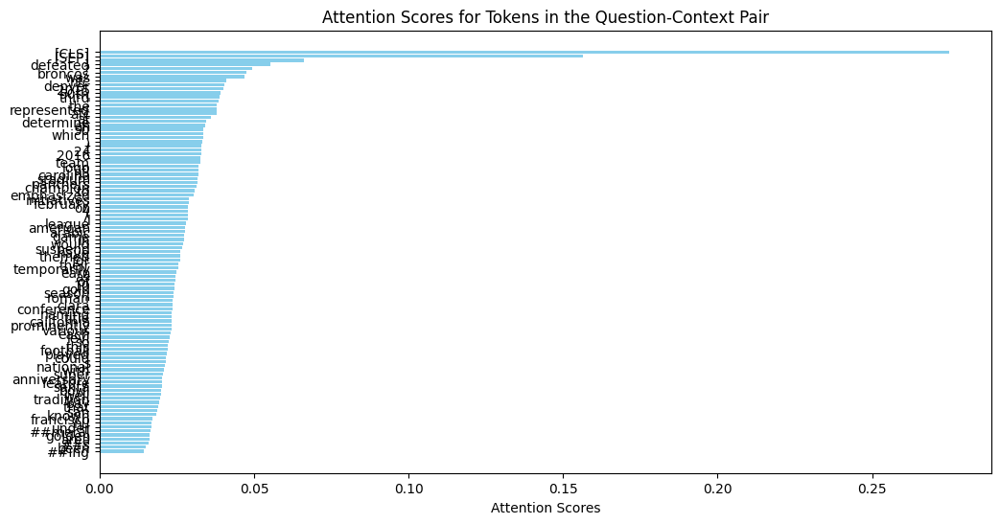

In [ ]:
plt.figure(figsize=(12, 6))
plt.barh(sorted_tokens, sorted_attention_scores, color='skyblue')
plt.xlabel('Attention Scores')
plt.title('Attention Scores for Tokens in the Question-Context Pair')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
!pip install ipython

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.0 MB/s eta 0:00:00


In [ ]:
from IPython.display import HTML

# Highlight tokens based on their attention scores
def highlight_tokens(tokens, scores, threshold=0.2):
    highlighted_text = []
    for i, token in enumerate(tokens):
        # Access the score for the current token
        score = scores[i]
        color = f"rgba(255, 255, 0, {score:.2f})" if score > threshold else f"rgba(0, 0, 0, 0.1)"
        highlighted_text.append(
            f'<span style="background-color: {color}; padding: 2px 4px; margin: 2px; border-radius: 4px;">{token}</span>'
        )
    return " ".join(highlighted_text)


In [ ]:
# HTML token highlighting
threshold = 0.07  # Set a threshold for highlighting tokens
highlighted_text_html = highlight_tokens(tokens, final_attention_scores.diagonal().tolist(), threshold)
HTML(highlighted_text_html)

In [ ]:
# Normalize attention scores for better visualization

scores = np.array(final_attention_scores.diagonal().tolist())
norm_scores = (scores - scores.min()) / (scores.max() - scores.min())  # Normalize to [0, 1]

# Filter out special tokens
filtered_tokens_scores = [
    (token, score)
    for token, score in zip(tokens, norm_scores.tolist())
    if token not in ["[CLS]", "[SEP]", "[PAD]"]
]

filtered_tokens, filtered_scores = zip(*filtered_tokens_scores)

# Highlight tokens
threshold = 0.05
highlighted_text_html = highlight_tokens(filtered_tokens, filtered_scores, threshold)
display(HTML(highlighted_text_html))


# **Visualization using BertViz**

In [ ]:
!pip install bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 89.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 6.7 MB/s eta 0:00:00


In [ ]:
attentions_list = []
tokens_list = []

for i in range(51):
    data = ds["validation"][i]
    question = data["question"]
    context = data["context"]
    inputs = tokenizer(question, context, return_tensors="pt", truncation=True)
    outputs = model(**inputs, output_attentions=True)
    attentions_list.append(outputs.attentions)
    tokens_list.append(tokenizer.convert_ids_to_tokens(inputs['input_ids'][0]))


BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [ ]:
sample_index = 50
sample_attention = attentions_list[sample_index]
sample_tokens = tokens_list[sample_index]

In [ ]:
from IPython.core.display import display, HTML

from bertviz import head_view

html_output = head_view(
    attention=sample_attention,
    tokens=sample_tokens,
    include_layers=[0],
    html_action="return"
)

display(html_output)

# **Experiment 3**

In [ ]:
!pip install captum

In [ ]:
import torch
from captum.attr import LayerIntegratedGradients
from transformers import BertTokenizer, BertForQuestionAnswering
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
example = ds['validation'][0]
question = example['question']
context = example['context']

In [ ]:
example

{'id': '56be4db0acb8001400a502ec',
 'title': 'Super_Bowl_50',
 'context': 'Super Bowl 50 was an American football game to determine the champion of the National Football League (NFL) for the 2015 season. The American Football Conference (AFC) champion Denver Broncos defeated the National Football Conference (NFC) champion Carolina Panthers 24–10 to earn their third Super Bowl title. The game was played on February 7, 2016, at Levi\'s Stadium in the San Francisco Bay Area at Santa Clara, California. As this was the 50th Super Bowl, the league emphasized the "golden anniversary" with various gold-themed initiatives, as well as temporarily suspending the tradition of naming each Super Bowl game with Roman numerals (under which the game would have been known as "Super Bowl L"), so that the logo could prominently feature the Arabic numerals 50.',
 'question': 'Which NFL team represented the AFC at Super Bowl 50?',
 'answers': {'text': ['Denver Broncos', 'Denver Broncos', 'Denver Broncos'],


In [ ]:
# Load pre-trained QA model
MODEL_NAME = "deepset/bert-base-cased-squad2"
tokenizer = BertTokenizer.from_pretrained(MODEL_NAME)
model = BertForQuestionAnswering.from_pretrained(MODEL_NAME)
model.eval()

Some weights of the model checkpoint at deepset/bert-base-cased-squad2 were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertForQuestionAnswering(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(28996, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, 

In [ ]:
inputs = tokenizer(
    question,
    context,
    return_tensors="pt",
    truncation=True,
    max_length=50,
    padding="max_length"
)
input_ids = inputs["input_ids"]
attention_mask = inputs["attention_mask"]

In [ ]:
def forward_func(input_ids, attention_mask):
    """Captum-compatible forward function."""
    outputs = model(input_ids=input_ids, attention_mask=attention_mask)
    return outputs.start_logits

# Interpretability Method - Layer Integrated Gradient

In [ ]:
# Define LayerIntegratedGradients for the embedding layer
lig = LayerIntegratedGradients(forward_func, model.bert.embeddings)

In [ ]:
attributions_start = lig.attribute(
    inputs=input_ids,
    additional_forward_args=(attention_mask,),  # Pass attention_mask correctly
    target=0,  # Targeting the first position in logits
    return_convergence_delta=False,
)

In [ ]:
attributions_start_sum = attributions_start.sum(dim=-1).squeeze(0).cpu().detach().numpy()

In [ ]:
tokens = tokenizer.convert_ids_to_tokens(input_ids.squeeze(0))

<ipython-input-25-b65a492ec6a1>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=tokens, y=attributions, palette="viridis")


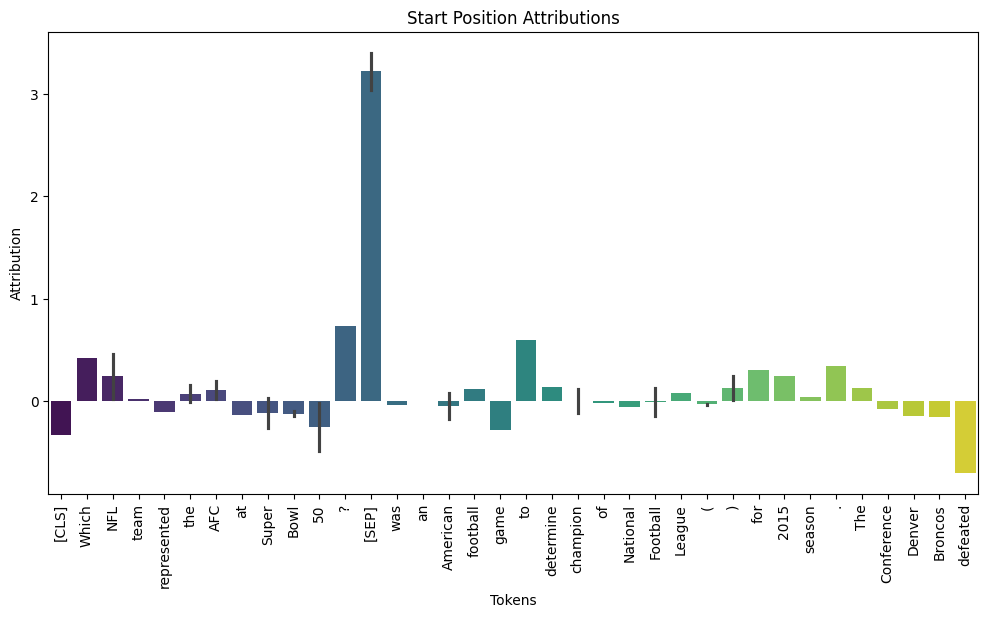

In [ ]:
def plot_attributions(tokens, attributions, title="Attributions"):
    plt.figure(figsize=(12, 6))
    sns.barplot(x=tokens, y=attributions, palette="viridis")
    plt.xticks(rotation=90)
    plt.xlabel("Tokens")
    plt.ylabel("Attribution")
    plt.title(title)
    plt.show()

plot_attributions(tokens, attributions_start_sum, title="Start Position Attributions")

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.core.display import display, HTML

In [ ]:
def highlight_tokens(tokens, attributions, threshold=0.5):
    """
    Highlight tokens based on attribution scores and threshold.
    """
    html_output = "<pre style='color:black; padding: 3px;'>"

    for i, token in enumerate(tokens):
        attribution = attributions[i]

        # Choose color based on the attribution score
        if attribution > threshold:
            rgba = matplotlib.cm.Reds(attribution)  # Highlight high attribution tokens in red
        else:
            rgba = matplotlib.cm.Blues(attribution)  # Low attribution tokens in blue

        color = f"background-color: rgba({rgba[0]*255}, {rgba[1]*255}, {rgba[2]*255}, {rgba[3]});"
        html_output += f"<span style='{color} border-radius: 5px; padding: 3px; font-weight: {int(800)}'>{token}</span> "

    html_output += "</pre>"
    return html_output

In [ ]:
html = highlight_tokens(tokens, attributions_start_sum)
display(HTML(html))

In [ ]:
html = highlight_tokens(tokens, attributions_start_sum, threshold = 0.05)
display(HTML(html))

In [ ]:
html = highlight_tokens(tokens, attributions_start_sum, threshold = 0.03)
display(HTML(html))

In [ ]:
html = highlight_tokens(tokens, attributions_start_sum, threshold = 0.3)
display(HTML(html))

# **Experiment 4**

**Capturing attention using BERT on sentiment anaysis task **

Dataset used: IMDB

In [ ]:
!pip install transformers-interpret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 56.5 MB/s eta 0:00:00


In [ ]:
!pip install transformers-interpret --upgrade

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.8 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from transformers import BertTokenizer, BertForSequenceClassification
from transformers_interpret import SequenceClassificationExplainer
from datasets import load_dataset
import matplotlib.pyplot as plt

In [ ]:
# Load pre-trained model and tokenizer
model_name = "textattack/bert-base-uncased-SST-2"  # You can choose a BERT model fine-tuned for sentiment analysis
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertForSequenceClassification.from_pretrained(model_name)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/477 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

In [ ]:
# Load the IMDB dataset (or a subset of it for faster processing)
dataset = load_dataset("imdb", split="test[:5%]")  # Use a small subset of the test set

README.md:   0%|          | 0.00/7.81k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/20.5M [00:00<?, ?B/s]

unsupervised-00000-of-00001.parquet:   0%|          | 0.00/42.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

In [ ]:
# Define a function to preprocess and explain text for each sample in the dataset
def explain_sample(sample_text):
    # Initialize the explainer
    explainer = SequenceClassificationExplainer(model, tokenizer)

    # Generate word attributions
    word_attributions = explainer(sample_text)

    # Visualize the explanation
    explainer.visualize()  # Visualize the word-level attributions (which tokens the model attended to)

In [ ]:
# Select a sample from the IMDB dataset (for demonstration, choose the first few samples)
for i in range(3):  # Visualizing first 3 samples for demo
    sample_text = dataset[i]['text']
    print(f"Explaining sample {i+1}: {sample_text[:100]}...")  # Print the first 100 characters for context
    explain_sample(sample_text)  # Explain and visualize the attribution
    plt.show()  # Show the plot for each explanation

Explaining sample 1: I love sci-fi and am willing to put up with a lot. Sci-fi movies/TV are usually underfunded, under-a...


Explaining sample 2: Worth the entertainment value of a rental, especially if you like action movies. This one features t...


Explaining sample 3: its a totally average film with a few semi-alright action sequences that make the plot seem a little...


# **Visualisation via LIME**

In [ ]:
import torch
import numpy as np
from transformers import BertTokenizer, BertForSequenceClassification
from datasets import load_dataset
from lime.lime_text import LimeTextExplainer


In [ ]:
# Load pre-trained BERT model and tokenizer
model_name = "textattack/bert-base-uncased-SST-2"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertForSequenceClassification.from_pretrained(model_name)
device = torch.device("cpu")  # Use CPU to prevent GPU memory crashes
model.to(device)
model.eval()

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [ ]:
# Load a small portion of the IMDB dataset
dataset = load_dataset("imdb", split="test[:100]")  # Load only 0.1% for testing

In [ ]:
# Define prediction function for LIME
def predict_proba(texts):
    encodings = tokenizer(texts, truncation=True, padding=True, max_length=20, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**encodings)
        logits = outputs.logits
    return torch.nn.functional.softmax(logits, dim=-1).cpu().numpy()


In [ ]:
# Initialize LIME explainer
explainer = LimeTextExplainer(class_names=["negative", "positive"])

In [ ]:
# Pick one text from the dataset
sample_text = dataset[0]["text"]


In [ ]:
# Generate LIME explanation
explanation = explainer.explain_instance(sample_text, predict_proba, num_features=10)

In [ ]:
# Visualize explanation
explanation.show_in_notebook(text=sample_text)